# Word Cloud Generation Using Pre-defined Vocabulary Dictionaries
Library Usage: nltk`pip install nltk`, wordcloud`pip install wordcloud`
## Steps
1. Load cleaned and processed data
2. Tokenize the descriptions
3. Use pre-defined dictionaries to count values such as programming language, education level, education subject, analysis tool, big-data related term, other keywords based on mapreduce result
4. Generate the wordcloud

In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import nltk
from nltk import word_tokenize
from nltk.corpus import stopwords
from collections import Counter
from wordcloud import WordCloud, STOPWORDS

In [3]:
rdf=pd.read_csv('../00-data/joblist_combined.csv')
rdf.head()

,title,company,location,description,salary,link
0,Computer Vision Scientist/Engineer,"Expedition Technology, Inc.","Dulles, VA",Computer Vision Scientist/Engineer\r\r\n\r\r\n...,NaN,NaN
1,Staff Computer Vision Scientist,WeWork,"Palo Alto, CA",Research Scientist/Manager:\r\r\nComputer Visi...,NaN,https://www.glassdoor.com/partner/jobListing.h...
2,"Data Scientist, Deep Learning/Computer Vision",Yummly,"Redwood City, CA",Born from the belief that great things come to...,$124K-$170K (Glassdoor est.),https://www.glassdoor.com/partner/jobListing.h...
3,Computer Vision Research Engineer,"Expedition Technology, Inc.","Dulles, VA",Computer Vision Research Engineer\r\r\n\r\r\nA...,NaN,NaN
4,Senior Software Engineer for OFP Development F...,Decisive Analytics,"Dayton, OH",Overview\r\r\n\r\r\nDECISIVE ANALYTICS Corpora...,$53K-$94K (Glassdoor est.),https://www.glassdoor.com/partner/jobListing.h...


#### Directly generate the wordcloud from descriptions by just remving stopwords

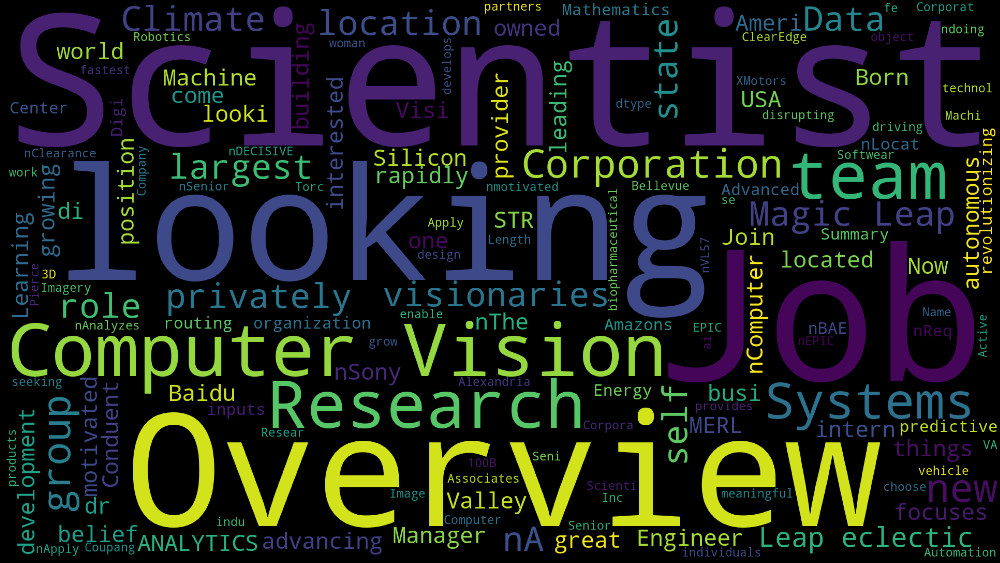

In [4]:
text = rdf['description']

stop_words = list(set(STOPWORDS))
custom_stop_list=['nAt','nFor', 'NYSE', 'nLocation', 'career', 'responsible', 'Description', 'deliver', 'overview, job']
for w in custom_stop_list:
    stop_words.append(w)

wordcloud = WordCloud(
    width = 1920,
    height = 1080,
    background_color = 'black',
    stopwords = stop_words).generate(str(text))

fig = plt.figure(
    figsize = (100, 80),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [5]:
def tokenize_description(description):
    """take a job description and return a list of tokens excluding stop words"""
    tokens = word_tokenize(description)
    stopset = set(stopwords.words('english'))
    tokens = [w.lower() for w in tokens if not w in stopset]
    text = nltk.Text(tokens)
    return list(set(text))
        
def find_skills_frequency(results_df):
    """count frequency of key words (as defined in dictionaries within function) appearing in job descriptions and return dataframe with skill frequency"""
    words = []
    for description in results_df['description']:
        try:
            words.append(tokenize_description(description))
        except:
            pass
    
    doc_frequency = Counter()
    [doc_frequency.update(word) for word in words]
    
    prog_lang_dict = Counter({'R':doc_frequency['r'], 'Python':doc_frequency['python'],
                    'Java':doc_frequency['java'], 'C++':doc_frequency['c++'],
                    'Ruby':doc_frequency['ruby'], 'Julia':doc_frequency['julia'],
                    'Perl':doc_frequency['perl'], 'Matlab':doc_frequency['matlab'], 
                    'Mathematica':doc_frequency['mathematica'], 'Php':doc_frequency['php'],
                    'JavaScript':doc_frequency['javascript'], 'Scala': doc_frequency['scala'],
                    'Octave':doc_frequency['octave'], 'C/C++':doc_frequency['c/c++'], 'C':doc_frequency['c'], 
                    'PyTorch':doc_frequency['pytorch']
                    ,'JS':doc_frequency['js']})
                
    database_dict = Counter({'SQL':doc_frequency['sql'], 'NoSQL':doc_frequency['nosql'],
                    'HBase':doc_frequency['hbase'], 'Cassandra':doc_frequency['cassandra'],
                    'MongoDB':doc_frequency['mongodb'], 'MySQL':doc_frequency['mysql']})
                    
    edu_dict = Counter({'Bachelor':doc_frequency['bachelor'],'Master':doc_frequency['master'],\
                          'PhD': doc_frequency['phd'],'BS':doc_frequency['bs'],'MS':doc_frequency['ms']})
          
    education_dict = Counter({'Computer Science':doc_frequency['computer-science'],  
                              'Statistics':doc_frequency['statistics'], 
                              'Mathematics':doc_frequency['mathematics'],
                              'Physics':doc_frequency['physics'], 
                              'Machine Learning':doc_frequency['machine-learning'], 
                              'Economics':doc_frequency['economics'], 
                              'Software Engineer': doc_frequency['software-engineer'],
                              'Information System':doc_frequency['information-system'], 
                              'Quantitative Finance':doc_frequency['quantitative-finance'],
                             'Biology':doc_frequency['biology']})
    
    analysis_tool_dict = Counter({'Excel':doc_frequency['excel'],  'Tableau':doc_frequency['tableau'],
                        'D3.js':doc_frequency['d3.js'], 'SAS':doc_frequency['sas'],
                        'SPSS':doc_frequency['spss'], 'D3':doc_frequency['d3'],
                        'Spotfire': doc_frequency['spotfire'],'Stata':doc_frequency['stata'],
                        'Power BI': doc_frequency['power bi']}) 
    
    hadoop_dict = Counter({'Hadoop':doc_frequency['hadoop'], 'MapReduce':doc_frequency['mapreduce'],
                'Spark':doc_frequency['spark'], 'Pig':doc_frequency['pig'],
                'Hive':doc_frequency['hive'], 'Shark':doc_frequency['shark'],
                'Oozie':doc_frequency['oozie'], 'ZooKeeper':doc_frequency['zookeeper'],
                'Flume':doc_frequency['flume'], 'Mahout':doc_frequency['mahout']})
    
    other_dict = Counter({'Azure':doc_frequency['azure'], 'AWS':doc_frequency['aws'], 'OpenCV':doc_frequency['opencv'], 'VR':doc_frequency['vr'], 'Git':doc_frequency['git'], 'Tensorflow':doc_frequency['tensorflow'], 'Docker':doc_frequency['docker'], 'RF':doc_frequency['rf'], 'GPU':doc_frequency['gpu'], 'Recognition':doc_frequency['recognition'], 'Visualization':doc_frequency['visualization'], 'Visual':doc_frequency['visual'], 'iOS':doc_frequency['ios'], 'IoT':doc_frequency['iot'], 'Robotic':doc_frequency['robotic'], 'Multidisciplinary':doc_frequency['multidisciplinary'], 'Modeling':doc_frequency['modeling'], 'SaaS':doc_frequency['saas'], 'Automate':doc_frequency['automate'], 'Cloud':doc_frequency['cloud'], 'AI':doc_frequency['ai'], 'Virtual':doc_frequency['virtual'], 'Robots':doc_frequency['robots'], 'Image':doc_frequency['image'], 'Oculus':doc_frequency['oculus'], 'GCP':doc_frequency['gcp'], 'Intelligence':doc_frequency['intelligence'], 'Verbal':doc_frequency['verbal'], 'Linux':doc_frequency['linux'], 'Research':doc_frequency['research'], 'Artificial':doc_frequency['artificial'], 'Prototyping':doc_frequency['prototyping'], 'AR':doc_frequency['ar'], 'VR':doc_frequency['vr'], 'VR':doc_frequency['vr']})
    
    model_dict = Counter({'DCNNs':doc_frequency['dcnns'], 'Bayes':doc_frequency['bayes'], 'SVM':doc_frequency['svm'], 'XGBoost':doc_frequency['xgboost'], 'CNN':doc_frequency['cnn'], 'NLP':doc_frequency['nlp'], 'Research':doc_frequency['research']})

    skills = prog_lang_dict +  database_dict + education_dict + edu_dict + analysis_tool_dict + hadoop_dict + other_dict
    
    skills_frame = pd.DataFrame(list(skills.items()), columns = ['Term', 'NumPostings'])
    #skills_frame.NumPostings = (skills_frame.NumPostings)*100/len(results_df)
    
    # Sort the data for plotting purposes
    skills_frame.sort_values(by='NumPostings', ascending = False, inplace = True)
    return skills_frame

In [6]:
nltk.download('punkt')
nltk.download('stopwords')

sdf=find_skills_frequency(rdf)

sdf.head()

,Term,NumPostings
69,Research,402
1,Python,389
63,Image,326
28,PhD,291
3,C++,263


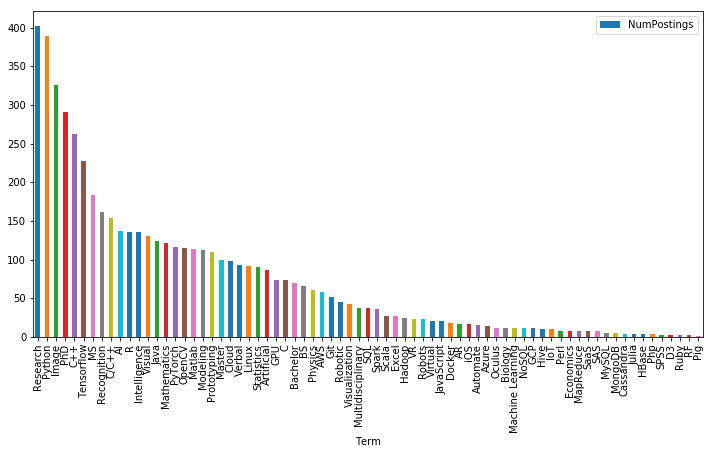

In [7]:
fig_size = [12, 6]
plt.rcParams["figure.figsize"] = fig_size
sdf.plot(x='Term', y='NumPostings', kind='bar')

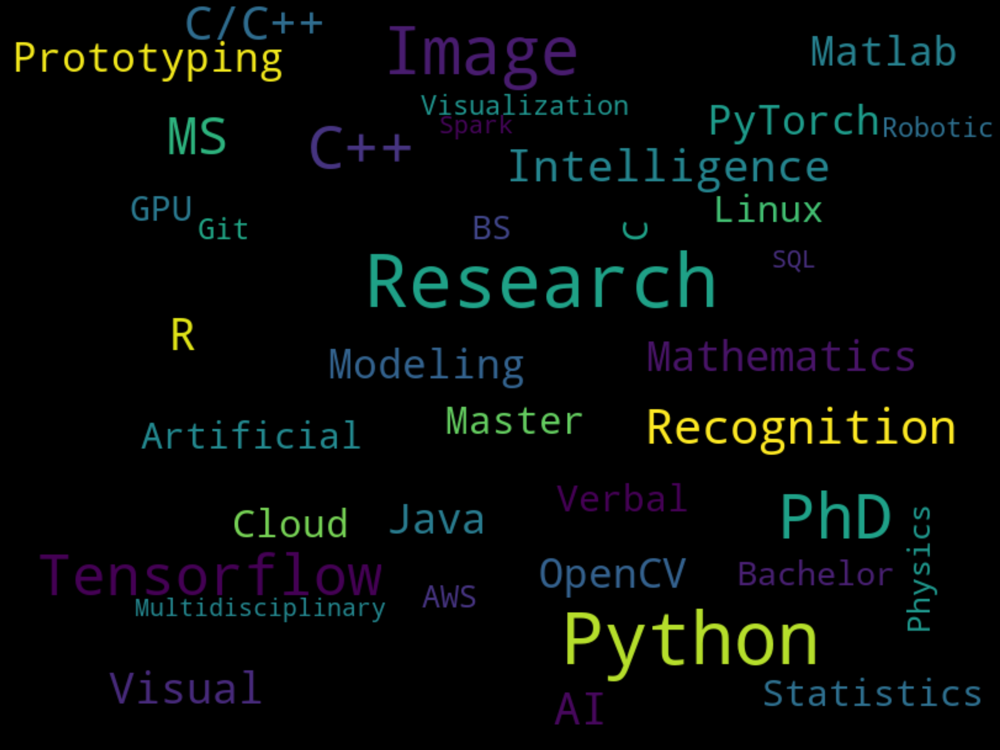

In [8]:
word_dict=pd.DataFrame(sdf.values.reshape(-1,2)).set_index(0).to_dict(orient='dict')[1]
wordcloud=WordCloud(width=800, height=600,background_color='black',collocations=False,min_font_size=20, max_font_size=60).generate_from_frequencies(word_dict)

fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [9]:
sdf['NumPostings']=1
sdf.head()

,Term,NumPostings
69,Research,1
1,Python,1
63,Image,1
28,PhD,1
3,C++,1


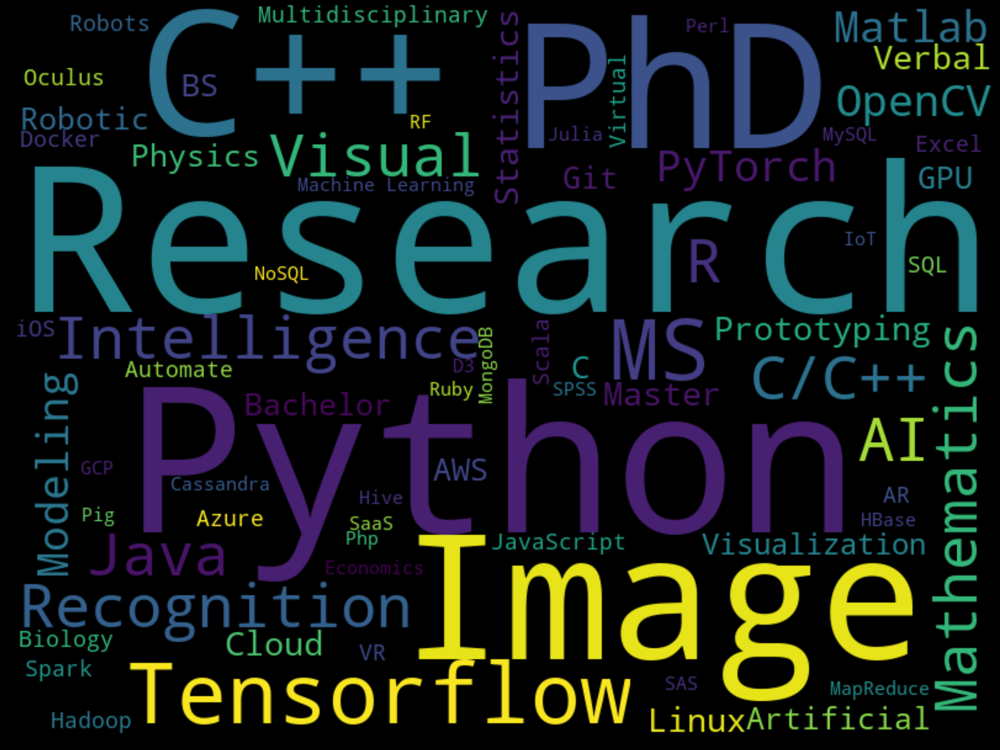

In [10]:
word_dict=pd.DataFrame(sdf.values.reshape(-1,2)).set_index(0).to_dict(orient='dict')[1]
wordcloud=WordCloud(width=800, height=600,background_color='black',collocations=False).generate_from_frequencies(word_dict)

fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

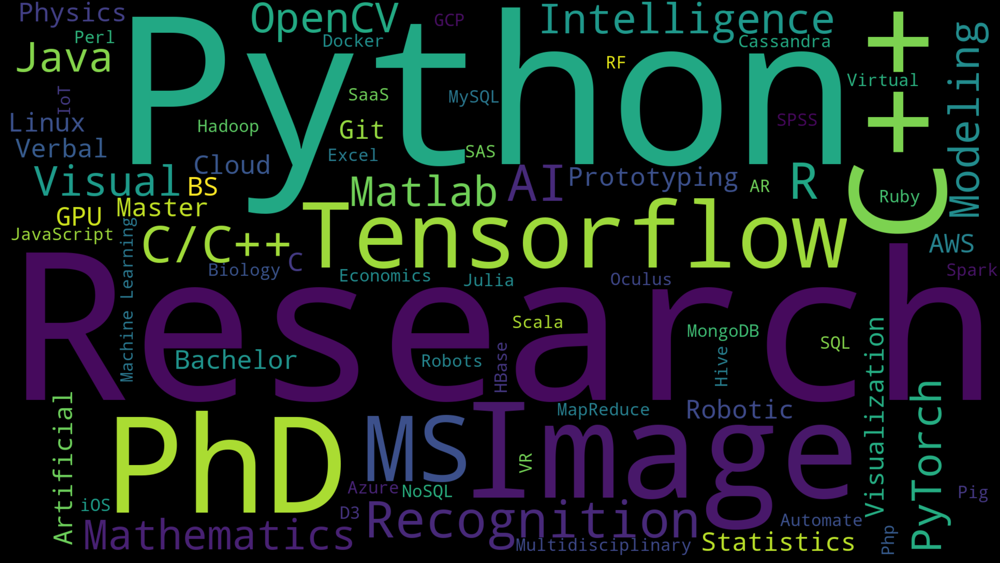

In [11]:
word_dict=pd.DataFrame(sdf.values.reshape(-1,2)).set_index(0).to_dict(orient='dict')[1]
wordcloud=WordCloud(width=1920, height=1080,background_color='black',collocations=False).generate_from_frequencies(word_dict)

fig = plt.figure(
    figsize = (100, 80),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

## Contributions 
-By own: 100%  
-By online resources: 0% 

## Citations
none

## License

Copyright 2019 COPYRIGHT Yunan Shao

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.